#### Import

In [1]:
# linear algebra 
import numpy as np 

# visualisation 
import matplotlib.pyplot as plt
import seaborn as sns

# data handling 
import pandas as pd 

# geospatial visualisation 
# pip install folium 
import folium


# Reading data

## Creating a randomly sampled subset from original dataset

In [58]:
import random 
random.seed(123)


p = 0.002  # % of the lines
# keep the header, then take only a % of lines
# if random from [0,1] interval is greater than 0.01 the row will be skipped
data = pd.read_csv(
         '/Users/matheusmaciel/CASS/MSc 2021-22 /Term 1 /Data Visualisation/Final /BasicCompanyDataAsOneFile-2021-12-01.csv',       #file path 
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p
)

In [3]:
data.head(5)

,CompanyName,CompanyNumber,RegAddress.CareOf,RegAddress.POBox,RegAddress.AddressLine1,RegAddress.AddressLine2,RegAddress.PostTown,RegAddress.County,RegAddress.Country,RegAddress.PostCode,...,PreviousName_7.CONDATE,PreviousName_7.CompanyName,PreviousName_8.CONDATE,PreviousName_8.CompanyName,PreviousName_9.CONDATE,PreviousName_9.CompanyName,PreviousName_10.CONDATE,PreviousName_10.CompanyName,ConfStmtNextDueDate,ConfStmtLastMadeUpDate
0,""" BORA "" 2 LTD",13220580,NaN,NaN,26 CARMICHAEL CLOSE,WINSTANLEY ESTATE,LONDON,BATTERSEA,ENGLAND,SW11 2HS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,08/03/2022,NaN
1,'VILLA ROSA' (WESTON-SUPER-MARE) MANAGEMENT CO...,00994704,NaN,NaN,18 BADMINTON ROAD,DOWNEND,BRISTOL,NaN,NaN,BS16 6BQ,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03/11/2022,20/10/2021
2,1 RED FROG LIMITED,07988571,NaN,NaN,86 KINGSMEAD AVENUE,NaN,WORCESTER PARK,NaN,NaN,KT4 8UZ,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22/03/2022,08/03/2021
3,1 STORAGE LTD,13501328,NaN,NaN,12E MANOR ROAD,NaN,LONDON,NaN,UNITED KINGDOM,N16 5SA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21/07/2022,NaN
4,1-2 SPORTS MANAGEMENT LTD,11720419,NaN,NaN,95B TRENTHAM ROAD,NaN,STOKE-ON-TRENT,NaN,UNITED KINGDOM,ST3 4EG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23/12/2021,09/12/2020


In [4]:
# saving data to csv for easier exploration , manipulation and prototyping
#data.to_csv("fcp_dataset.csv")

## Data preparation

In [59]:
df = data

In [6]:
df.head(3)

,CompanyName,CompanyNumber,RegAddress.CareOf,RegAddress.POBox,RegAddress.AddressLine1,RegAddress.AddressLine2,RegAddress.PostTown,RegAddress.County,RegAddress.Country,RegAddress.PostCode,...,PreviousName_7.CONDATE,PreviousName_7.CompanyName,PreviousName_8.CONDATE,PreviousName_8.CompanyName,PreviousName_9.CONDATE,PreviousName_9.CompanyName,PreviousName_10.CONDATE,PreviousName_10.CompanyName,ConfStmtNextDueDate,ConfStmtLastMadeUpDate
0,""" BORA "" 2 LTD",13220580,NaN,NaN,26 CARMICHAEL CLOSE,WINSTANLEY ESTATE,LONDON,BATTERSEA,ENGLAND,SW11 2HS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,08/03/2022,NaN
1,'VILLA ROSA' (WESTON-SUPER-MARE) MANAGEMENT CO...,00994704,NaN,NaN,18 BADMINTON ROAD,DOWNEND,BRISTOL,NaN,NaN,BS16 6BQ,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03/11/2022,20/10/2021
2,1 RED FROG LIMITED,07988571,NaN,NaN,86 KINGSMEAD AVENUE,NaN,WORCESTER PARK,NaN,NaN,KT4 8UZ,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22/03/2022,08/03/2021


In [7]:
# Dropping unnecessary columns
df.drop(["RegAddress.CareOf",
        "RegAddress.POBox", 
        "URI",
        " PreviousName_1.CompanyName",
        "PreviousName_1.CONDATE",
        " PreviousName_1.CompanyName",
        " PreviousName_2.CONDATE",
        " PreviousName_2.CompanyName",
        "PreviousName_3.CONDATE",
        " PreviousName_3.CompanyName",
        "PreviousName_4.CONDATE",
        " PreviousName_4.CompanyName",
        "PreviousName_5.CONDATE",
        " PreviousName_5.CompanyName",
        "PreviousName_6.CONDATE",
        " PreviousName_6.CompanyName",
        "PreviousName_7.CONDATE",
        " PreviousName_7.CompanyName",
        "PreviousName_8.CONDATE",
        " PreviousName_8.CompanyName",
        "PreviousName_9.CONDATE",
        " PreviousName_9.CompanyName",
        "PreviousName_10.CONDATE",
        " PreviousName_10.CompanyName",
        "SICCode.SicText_2",
        "SICCode.SicText_3",
        "SICCode.SicText_4",
        "DissolutionDate"], axis = 1, inplace = True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10130 entries, 0 to 10129
Data columns (total 28 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   CompanyName                         10130 non-null  object 
 1    CompanyNumber                      10130 non-null  object 
 2   RegAddress.AddressLine1             10027 non-null  object 
 3    RegAddress.AddressLine2            6289 non-null   object 
 4   RegAddress.PostTown                 9945 non-null   object 
 5   RegAddress.County                   3547 non-null   object 
 6   RegAddress.Country                  7366 non-null   object 
 7   RegAddress.PostCode                 9990 non-null   object 
 8   CompanyCategory                     10130 non-null  object 
 9   CompanyStatus                       10130 non-null  object 
 10  CountryOfOrigin                     10130 non-null  object 
 11  IncorporationDate                   10130

In [9]:
#change column to datetime format 
df['IncorporationDate'] = pd.to_datetime(df.IncorporationDate)

# Visualisation 1 - Geospatial (Heatmap)

### Data preparation

In [10]:
# dataset with UK post codes and its coordinates used to plot location
post_code = pd.read_csv('/Users/matheusmaciel/Downloads/ukpostcodes.csv',index_col=[0]) 


/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [11]:
# chaging column name to match original dataset, allowing both to be merged 
post_code = post_code.rename(columns={'postcode':'RegAddress.PostCode'})
post_code

,RegAddress.PostCode,latitude,longitude
id,,,
1,AB10 1XG,57.144165,-2.114848
2,AB10 6RN,57.137880,-2.121487
3,AB10 7JB,57.124274,-2.127190
4,AB11 5QN,57.142701,-2.093295
5,AB11 6UL,57.137547,-2.112233
...,...,...,...
2686324,YO7 3FQ,54.223396,-1.357010
2686325,YO7 3FR,54.223853,-1.356849
2686326,YO8 1DX,53.784954,-1.067704


In [12]:
# df specific for V1 
v1_df = df[['CompanyName',
            'IncorporationDate',
            'CompanyStatus',
            "RegAddress.Country",
            "RegAddress.PostCode"]].copy()

# set index
#v1_df = v1_df.set_index('CompanyName')


#drop NAs
v1_df = v1_df.dropna(inplace = False)

#view df
v1_df


,CompanyName,IncorporationDate,CompanyStatus,RegAddress.Country,RegAddress.PostCode
0,""" BORA "" 2 LTD",2021-02-23,Active,ENGLAND,SW11 2HS
3,1 STORAGE LTD,2021-08-07,Active,UNITED KINGDOM,N16 5SA
4,1-2 SPORTS MANAGEMENT LTD,2018-10-12,Active,UNITED KINGDOM,ST3 4EG
5,1-6 CHEQUERS CLOSE (LONDON) FREEHOLD COMPANY L...,2019-11-27,Active,ENGLAND,HA8 5EJ
6,10/11 COURTFIELD MANAGEMENT LIMITED,1987-09-24,Active,ENGLAND,WD18 9TB
...,...,...,...,...,...
10125,ZOPA LIMITED,2004-04-08,Active,ENGLAND,SE1 2QG
10126,ZRM CONSTRUCT LIMITED,2021-11-23,Active,ENGLAND,SW16 6ER
10127,ZSPW LIMITED,2012-09-10,Active,ENGLAND,CM1 1GU
10128,ZUNZU LTD,2020-03-31,Active,ENGLAND,IP22 2HF


### Prototyping with a smaller sub-sample

In [13]:
v1_test = v1_df.sample(10)

v1_test

,CompanyName,IncorporationDate,CompanyStatus,RegAddress.Country,RegAddress.PostCode
7576,REVOLUTIONARY QUALITY CARE SOLUTIONS LTD,2021-10-13,Active,ENGLAND,B43 5SB
2823,ECO-TRIP LTD,2020-03-06,Active,ENGLAND,CR2 0AS
228,AASHUN MARKETING LTD,2018-07-16,Active,ENGLAND,WA1 1RL
1993,CLASSIC CATERING OF ROMILEY LIMITED,2018-03-28,Active,ENGLAND,SK4 5JY
8200,SIS COMMUNITY LIFE LTD,2018-10-26,Active,ENGLAND,IG1 1BE
5992,MILLER PROPERTIES & REAL ESTATE LTD,2018-12-20,Active,ENGLAND,DL1 5RX
8326,SOLEFIX LTD.,2021-11-08,Active,UNITED KINGDOM,WC2H 9JQ
2141,CONTRIVE DESIGN LTD,2020-07-02,Active,ENGLAND,CM9 4QA
3614,GEORGE HUMPHREY LIMITED,1926-07-16,Active,UNITED KINGDOM,ME16 8RY
8354,SOS SECRET OPERA SINGERS LTD,2013-04-15,Active,SCOTLAND,G1 1DA


In [14]:
test_merge = v1_test.merge(post_code).set_axis(v1_test.index)
test_merge

,CompanyName,IncorporationDate,CompanyStatus,RegAddress.Country,RegAddress.PostCode,latitude,longitude
7576,REVOLUTIONARY QUALITY CARE SOLUTIONS LTD,2021-10-13,Active,ENGLAND,B43 5SB,52.543424,-1.940297
2823,ECO-TRIP LTD,2020-03-06,Active,ENGLAND,CR2 0AS,51.344520,-0.073789
228,AASHUN MARKETING LTD,2018-07-16,Active,ENGLAND,WA1 1RL,53.381000,-2.599000
1993,CLASSIC CATERING OF ROMILEY LIMITED,2018-03-28,Active,ENGLAND,SK4 5JY,53.432609,-2.169604
8200,SIS COMMUNITY LIFE LTD,2018-10-26,Active,ENGLAND,IG1 1BE,51.559000,0.076000
5992,MILLER PROPERTIES & REAL ESTATE LTD,2018-12-20,Active,ENGLAND,DL1 5RX,54.522386,-1.555908
8326,SOLEFIX LTD.,2021-11-08,Active,UNITED KINGDOM,WC2H 9JQ,51.514923,-0.123654
2141,CONTRIVE DESIGN LTD,2020-07-02,Active,ENGLAND,CM9 4QA,51.733862,0.678262
3614,GEORGE HUMPHREY LIMITED,1926-07-16,Active,UNITED KINGDOM,ME16 8RY,51.270073,0.512227
8354,SOS SECRET OPERA SINGERS LTD,2013-04-15,Active,SCOTLAND,G1 1DA,55.859760,-4.250948


In [15]:
# make empty map 
m = folium.Map(location = [20, 0], tiles="OpenStreetMap" , zoom_start=2)

# show map
m

In [16]:
# add marker one by one on the map
for i in range(0,len(test_merge)):
   folium.Circle(
      location=[test_merge.iloc[i]['latitude'], test_merge.iloc[i]['longitude']],
      popup=test_merge.iloc[i]['CompanyStatus'],
      #radius=float(test_merge.iloc[i]['value'])*20000,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)
   
   
# show map 
m

### Plotting

In [17]:
merge = v1_df.merge(post_code)      #.set_axis(v1_df.index)
merge

,CompanyName,IncorporationDate,CompanyStatus,RegAddress.Country,RegAddress.PostCode,latitude,longitude
0,""" BORA "" 2 LTD",2021-02-23,Active,ENGLAND,SW11 2HS,51.465249,-0.175678
1,1 STORAGE LTD,2021-08-07,Active,UNITED KINGDOM,N16 5SA,51.566368,-0.075364
2,RJM DEVELOPMENT LTD,2019-08-02,Active,ENGLAND,N16 5SA,51.566368,-0.075364
3,1-2 SPORTS MANAGEMENT LTD,2018-10-12,Active,UNITED KINGDOM,ST3 4EG,52.978849,-2.137169
4,1-6 CHEQUERS CLOSE (LONDON) FREEHOLD COMPANY L...,2019-11-27,Active,ENGLAND,HA8 5EJ,51.602558,-0.270338
...,...,...,...,...,...,...,...
7299,ZONGOLA RECRUITMENT LTD,2020-07-10,Active,ENGLAND,M3 2BY,53.480345,-2.247953
7300,ZOPA LIMITED,2004-04-08,Active,ENGLAND,SE1 2QG,51.506064,-0.084722
7301,ZRM CONSTRUCT LIMITED,2021-11-23,Active,ENGLAND,SW16 6ER,51.425073,-0.130132
7302,ZUNZU LTD,2020-03-31,Active,ENGLAND,IP22 2HF,52.337045,0.911783


In [18]:
merge.CompanyStatus.unique()

array(['Active', 'Active - Proposal to Strike off', 'Liquidation',
       'Live but Receiver Manager on at least one charge',
       'Voluntary Arrangement'], dtype=object)

In [19]:
merge = merge.query('CompanyStatus != "Active"')

merge


,CompanyName,IncorporationDate,CompanyStatus,RegAddress.Country,RegAddress.PostCode,latitude,longitude
7,100 TUNE LIMITED,2016-07-07,Active - Proposal to Strike off,UNITED KINGDOM,TQ2 5EL,50.461381,-3.525644
14,LACQUER AND SPA LTD,2019-09-20,Active - Proposal to Strike off,ENGLAND,W8 4BX,51.504299,-0.192794
42,MEH RECRUITMENT LTD,2020-07-27,Active - Proposal to Strike off,ENGLAND,EC2A 4NE,51.525615,-0.083649
53,1ST NATION LIMITED,2014-03-10,Liquidation,ENGLAND,WV14 7LF,52.561996,-2.060851
77,DISCOVERY MANAGEMENT LIMITED,2020-04-07,Active - Proposal to Strike off,ENGLAND,SG8 5LF,52.078419,-0.053007
...,...,...,...,...,...,...,...
7227,XXIIAA LIMITED,2019-12-08,Active - Proposal to Strike off,UNITED KINGDOM,PO6 3FL,50.843000,-1.068000
7232,YAMI RYORI LIMITED,2020-07-23,Active - Proposal to Strike off,UNITED KINGDOM,RM7 0YQ,51.560462,0.179534
7233,YAMUNA INDIAN LIMITED,2018-05-30,Active - Proposal to Strike off,UNITED KINGDOM,SW7 2HP,51.495186,-0.173979
7254,YOUNG AND GIFTED LIMITED,2010-07-07,Active - Proposal to Strike off,ENGLAND,E17 6HE,51.587869,-0.035219


In [20]:
from folium.plugins import HeatMap
from folium import plugins
from folium import IFrame

# make list of lat and lon valus
lat = merge.latitude.tolist()
lon= merge.longitude.tolist()

# Title
title = 'Heatmap of businesses in the process of dissolution in the UK'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(title) 
             
# text for annotation
t = 'COVID-19 impacted businesses nationwide. The heatmap indicates companies in the process of dissolution are spread across the UK. Particularly, in the central areas of London, the economic heart of the UK' 

#Create the Map
map = folium.Map(
   location=[53.657, -1.727],
   tiles='cartodbdark_matter',
   zoom_start=6)

map.get_root().html.add_child(folium.Element(title_html))

# add marker one by one on the map
for i in range(0,len(merge)):
   folium.Circle(
      location=[merge.iloc[i]['latitude'], merge.iloc[i]['longitude']],
      popup= merge.iloc[i]['CompanyName'],
      fill=False,
   ).add_to(map)

# annotation
iframe = folium.IFrame(t, width=200, height=200)
popup = folium.Popup(iframe, max_width=3000)

Text = folium.Marker(location=[50.261, -9.229], popup=popup,
                     icon=folium.Icon(icon_color='green'))
map.add_child(Text)

# Add minimap 
minimap = plugins.MiniMap()
map.add_child(minimap)

HeatMap(list(zip(lat, lon))).add_to(map)
# show map 
map

# Visualisation 2 - Sankey diagram

### Data preparation

In [21]:
from bokeh.plotting import figure, show 
from bokeh.io import output_notebook

output_notebook()

Loading BokehJS ...

In [60]:
# df specific for V1 
v2_df = df[['CompanyName',
            'SICCode.SicText_1',
            'CompanyStatus'
            ]].copy()

v2_df = v2_df.rename({'SICCode.SicText_1': 'SICCode'}, axis=1)

v2_df

,CompanyName,SICCode,CompanyStatus
0,""" BORA "" 2 LTD",47820 - Retail sale via stalls and markets of ...,Active
1,'VILLA ROSA' (WESTON-SUPER-MARE) MANAGEMENT CO...,98000 - Residents property management,Active
2,1 RED FROG LIMITED,"74909 - Other professional, scientific and tec...",Active
3,1 STORAGE LTD,52103 - Operation of warehousing and storage f...,Active
4,1-2 SPORTS MANAGEMENT LTD,93199 - Other sports activities,Active
...,...,...,...
10125,ZOPA LIMITED,64929 - Other credit granting n.e.c.,Active
10126,ZRM CONSTRUCT LIMITED,42210 - Construction of utility projects for f...,Active
10127,ZSPW LIMITED,46180 - Agents specialized in the sale of othe...,Active
10128,ZUNZU LTD,86102 - Medical nursing home activities,Active


In [24]:
# removing some unecessary / irrelevant categories 
v2_df = v2_df[~v2_df.SICCode.str.contains("99999 - Dormant Company" and "None Supplied")]

#v2_df['count'] = 1

v2_df

,CompanyName,SICCode,CompanyStatus
7,100 TUNE LIMITED,47820 - Retail sale via stalls and markets of ...,Active - Proposal to Strike off
14,13 AMP CONSULTING LTD,66190 - Activities auxiliary to financial inte...,Liquidation
35,1ST NATION LIMITED,24100 - Manufacture of basic iron and steel an...,Liquidation
69,2L CAPITAL LIMITED,96090 - Other service activities n.e.c.,Active - Proposal to Strike off
75,3 HARBOURS GLOBAL LOGISTICS LIMITED,50200 - Sea and coastal freight water transport,Active - Proposal to Strike off
...,...,...,...
10058,YOUNG AND GIFTED LIMITED,56302 - Public houses and bars,Active - Proposal to Strike off
10087,ZAROMCO RECYCLING LTD,38120 - Collection of hazardous waste,Active - Proposal to Strike off
10099,ZENITH TECHNOLOGIES LIMITED,"46510 - Wholesale of computers, computer perip...",Active - Proposal to Strike off
10103,ZEST TELECOM LIMITED,61900 - Other telecommunications activities,Active - Proposal to Strike off


In [25]:
#check for null values
v2_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 673 entries, 7 to 10116
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   CompanyName    673 non-null    object
 1   SICCode        673 non-null    object
 2   CompanyStatus  673 non-null    object
dtypes: object(3)
memory usage: 21.0+ KB


In [26]:
#pip install holoviews

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
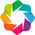

In [27]:
import holoviews as hv
from holoviews import opts, dim
hv.extension('bokeh')
from bokeh.plotting import show

### Restaurant sector

In [61]:
restaurant_food = v2_df.query('SICCode == "56101 - Licensed restaurants" |\
    SICCode == "56103 - Take-away food shops and mobile food stands" |\
        SICCode == "56210 - Event catering activities" |\
            SICCode == "56102 - Unlicensed restaurants and cafes"|\
                SICCode == "55100 - Hotels and similar accommodation"|\
                    SICCode == "55201 - Holiday centres and villages"|\
                        SICCode == "56290 - Other food services"|\
                            SICCode == "56301 - Licenced clubs"|\
                                SICCode == "56302 - Public houses and bars"'
            )
restaurant_food['count'] = 1
restaurant_food

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,CompanyName,SICCode,CompanyStatus,count
10,114 GPS LIMITED,56101 - Licensed restaurants,Active,1
11,11:11 (44) LIMITED,56302 - Public houses and bars,Active,1
51,215HACKNEY LTD,56102 - Unlicensed restaurants and cafes,Active,1
86,36 CAFE AND BISTRO LIMITED,56102 - Unlicensed restaurants and cafes,Active,1
104,3N'S DORCHESTER LTD,56103 - Take-away food shops and mobile food s...,Active,1
...,...,...,...,...
10052,YOOTIME LTD,56290 - Other food services,Active,1
10058,YOUNG AND GIFTED LIMITED,56302 - Public houses and bars,Active - Proposal to Strike off,1
10069,YUMBURG LIMITED,56103 - Take-away food shops and mobile food s...,Active,1
10075,Z HOTELS STRAND LTD,55100 - Hotels and similar accommodation,Active,1


In [62]:
sankey_rest = hv.Sankey(restaurant_food, kdims=['SICCode', 'CompanyStatus'], vdims=['count', 'CompanyName'])

sankey_rest.opts(cmap = 'bkr',
                 edge_color = 'SICCode',
                 edge_line_width=0,
                 node_alpha=1.0,
                 node_width=40,
                 node_sort=False,
                 bgcolor="snow",
                 width=1200, height=400,
                 title="What happened to different industries following the pandemic?")
    
show(hv.render(sankey_rest))

### Service activities

In [63]:
service_act = v2_df.query('SICCode == "96020 - Hairdressing and other beauty treatment"|\
    SICCode == "96040 - Physical well-being activities" |\
        SICCode == "96010 - Washing and (dry-)cleaning of textile and fur products"')
service_act['count'] = 1
service_act

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,CompanyName,SICCode,CompanyStatus,count
70,2SCISSORBOYS LTD,96020 - Hairdressing and other beauty treatment,Active,1
192,"A&R HAIR,BEAUTY & AESTHETICS LTD",96020 - Hairdressing and other beauty treatment,Active,1
208,A.M PSYCHOTHERAPY SERVICES LIMITED,96040 - Physical well-being activities,Active,1
463,ALEXANDRE LOOF HAIRCOLORIST LTD,96020 - Hairdressing and other beauty treatment,Active,1
508,ALOUSE LTD,96020 - Hairdressing and other beauty treatment,Active,1
...,...,...,...,...
9409,TWIST HAIR LTD.,96020 - Hairdressing and other beauty treatment,Active,1
9644,VINTAGE BARBERS (LOSTOCK HALL) LIMITED,96020 - Hairdressing and other beauty treatment,Active,1
9765,WE ARE BROTHERHOOD LIMITED,96020 - Hairdressing and other beauty treatment,Active,1
9859,WHITE WOLF YOGA LIMITED,96040 - Physical well-being activities,Active,1


In [64]:
sankey_serv = hv.Sankey(service_act, kdims=['SICCode', 'CompanyStatus'], vdims=['count', 'CompanyName'])

sankey_serv.opts(cmap = 'bkr',
                 edge_color = 'SICCode',
                 edge_line_width=0,
                 node_alpha=1.0,
                 node_width=40,
                 node_sort=False,
                 bgcolor="snow",
                 width=1200, height=400,
                 title="What happened different industries following the pandemic?")
    
show(hv.render(sankey_serv))

### Construction

In [67]:
construct = v2_df.query('SICCode == "41100 - Development of building projects" |\
    SICCode == "41202 - Construction of domestic buildings" |\
        SICCode == "43999 - Other specialised construction activities n.e.c." |\
            SICCode == "41201 - Construction of commercial buildings"|\
                    SICCode == "43341 - Painting"|\
                        SICCode == "43220 - Plumbing, heat and air-conditioning installation"|\
                            SICCode == "43210 - Electrical installation"')
construct['count'] = 1
construct

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,CompanyName,SICCode,CompanyStatus,count
56,24 HOUR ACCESS LIMITED,43999 - Other specialised construction activit...,Active,1
59,24/7 BOILER REPAIRS AND REPLACEMENT LTD,"43220 - Plumbing, heat and air-conditioning in...",Active,1
76,3 PROPERTY PILLARS LTD,41100 - Development of building projects,Active,1
89,360 WORKPLACE LIMITED,43999 - Other specialised construction activit...,Active,1
97,3D.DM LTD,43999 - Other specialised construction activit...,Active,1
...,...,...,...,...
10026,YASO 18 LTD,41201 - Construction of commercial buildings,Active,1
10037,YEWGROVE PROPERTIES LIMITED,41202 - Construction of domestic buildings,Active,1
10077,Z&Z HOUSE MAINTENANCE LTD,41202 - Construction of domestic buildings,Active,1
10111,ZIP WORLD ADVENTURE HOTEL LIMITED,41100 - Development of building projects,Active,1


In [68]:
sankey_constr = hv.Sankey(construct, kdims=['SICCode', 'CompanyStatus'], vdims=['count', 'CompanyName'])

sankey_constr.opts(cmap = 'bkr',
                 edge_color = 'SICCode',
                 edge_line_width=0,
                 node_alpha=1.0,
                 node_width=40,
                 node_sort=False,
                 bgcolor="snow",
                 width=1250, height=400,
                 title="What happened different industries following the pandemic?")
    
show(hv.render(sankey_constr))

### Arts, entertainment and recreation 

In [71]:
arts = v2_df.query('SICCode == "90010 - Performing arts" |\
    SICCode == "90030 - Artistic creation" |\
            SICCode == "91020 - Museum activities" |\
                SICCode == "92000 - Gambling and betting activities" |\
                    SICCode == "93130 - Fitness facilities" |\
                        SICCode == " 93210 - Activities of amusement parks and theme parks" |\
                            SICCode == "93120 - Activities of sport clubs"')
arts['count'] = 1
arts

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,CompanyName,SICCode,CompanyStatus,count
419,AJD FOOTBALL COACHING LIMITED,93130 - Fitness facilities,Active,1
483,ALL OR NOTHING REPERTORY THEATRE COMPANY LTD.,90010 - Performing arts,Active,1
542,AMARI'S UNIVERSE FITNESS & BOXING GYM LTD,93130 - Fitness facilities,Active,1
757,ARTSMARKETGALLERY LIMITED,90030 - Artistic creation,Active,1
881,AUTOMATIC SONGS LIMITED,90030 - Artistic creation,Active,1
...,...,...,...,...
9396,TUTTI FRUTTI PRODUCTIONS,90010 - Performing arts,Active,1
9414,TWYFORD COMMUNITY CENTER CIC,93130 - Fitness facilities,Active,1
9505,UNSKILLED WORKER LIMITED,90030 - Artistic creation,Active,1
9750,WATERFRONT-STUDENT UNION SERVICES LIMITED,90010 - Performing arts,Active,1


In [72]:
sankey_art = hv.Sankey(arts, kdims=['SICCode', 'CompanyStatus'], vdims=['count', 'CompanyName'])

sankey_art.opts(cmap = 'bkr',
                 edge_color = 'SICCode',
                 edge_line_width=0,
                 node_alpha=1.0,
                 node_width=40,
                 node_sort=False,
                 bgcolor="snow",
                 width=1200, height=400,
                 title="What happened different industries following the pandemic?")
    
show(hv.render(sankey_art))

### Financial and Insurance activities

In [73]:
finance = v2_df.query('SICCode == "64191 - Banks" |\
    SICCode == "64192 - Building societies" |\
        SICCode == "65110 - Life insurance" |\
            SICCode == "64205 - Activities of financial services holding companies" |\
                SICCode == "64209 - Activities of other holding companies n.e.c." |\
                    SICCode == "64301 - Activities of investment trusts" |\
                            SICCode == "65120 - Non-life insurance" |\
                                SICCode == "64306 - Activities of real estate investment trusts" |\
                                    SICCode == "66300 - Fund management activities" |\
                                        SICCode == "64306 - Activities of real estate investment trusts"')
finance['count'] = 1
finance

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,CompanyName,SICCode,CompanyStatus,count
158,A BHAYAT HOLDINGS LIMITED,64209 - Activities of other holding companies ...,Active,1
253,ABMH HOLDINGS LIMITED,64209 - Activities of other holding companies ...,Active,1
265,ACA OPPORTUNITY LTD,64306 - Activities of real estate investment t...,Active,1
283,ACE ARC HOLDINGS LIMITED,64209 - Activities of other holding companies ...,Active,1
298,ACS VENTURES LTD,64209 - Activities of other holding companies ...,Active,1
...,...,...,...,...
10013,XNBORNE CAPITAL LIMITED,66300 - Fund management activities,Active,1
10016,XXIIAA LIMITED,64301 - Activities of investment trusts,Active - Proposal to Strike off,1
10070,YUNIKA LONDON LTD,64306 - Activities of real estate investment t...,Active,1
10088,ZAVANDA HOLDINGS LIMITED,64209 - Activities of other holding companies ...,Active,1


In [74]:
sankey_finance = hv.Sankey(finance, kdims=['SICCode', 'CompanyStatus'], vdims=['count', 'CompanyName'])

sankey_finance.opts(cmap = 'bkr',
                 edge_color = 'SICCode',
                 edge_line_width=0,
                 node_alpha=1.0,
                 node_width=40,
                 node_sort=False,
                 bgcolor="snow",
                 width=1250, height=400,
                 title="What happened different industries following the pandemic?")
    
show(hv.render(sankey_finance))

## Assembling all plots into one figure 

In [75]:
import panel as pn
from bokeh.plotting import figure
pn.extension()


tabs = pn.Tabs(('Restaurants & Catering', sankey_rest),('Construction', sankey_constr), ('Services', sankey_serv),('Finance',sankey_finance), ('Arts & Entertainment', sankey_art), )
tabs

Tabs
    [0] HoloViews(Sankey, name='Restaurants & Catering')
    [1] HoloViews(Sankey, name='Construction')
    [2] HoloViews(Sankey, name='Services')
    [3] HoloViews(Sankey, name='Finance')
    [4] HoloViews(Sankey, name='Arts & Entertainment')

# Visualisation 3 - Heatmap 

### Data preparation

In [80]:
# Get another randomly sampled dataset, this time with more data since it will be beneficial for the analysis 
# Random sample using a different method for variety and exploring different solutions with Python
df = pd.read_csv(
         '/Users/matheusmaciel/CASS/MSc 2021-22 /Term 1 /Data Visualisation/Final /BasicCompanyDataAsOneFile-2021-12-01.csv',       #file path 
)

df = df.sample(20000, random_state=1)

/opt/anaconda3/envs/data_viz/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3186: DtypeWarning: Columns (41,42,43,44,45,46,47,48,49,50,51,52) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [81]:
# df specific for V3 
v3_df = df[['CompanyName',
            'SICCode.SicText_1',
            'CompanyStatus', 
            'IncorporationDate'
            ]].copy()

v3_df = v3_df.rename({'SICCode.SicText_1': 'SICCode'}, axis=1)

#change column to datetime format 
v3_df['IncorporationDate'] = pd.to_datetime(df.IncorporationDate)

In [82]:
# Creating a new row with the month
v3_df['Month'] = pd.DatetimeIndex(v3_df['IncorporationDate']).month

## Creating a new row with the month
v3_df['Year'] = pd.DatetimeIndex(v3_df['IncorporationDate']).year

v3_df['Month'] = v3_df['Month'].replace({1:"January", 
                                     2:'February',
                                     3:'March',
                                     4:'April',
                                     5:'May', 
                                     6:'June', 
                                     7:'July',
                                     8:'August', 
                                     9:'September',
                                     10:'October',
                                     11:'November',
                                     12:'December'
})



In [94]:
data = pd.pivot_table(v3_df,
                      values='CompanyName',
                      index=['Year'],
                      columns=['Month'],
                      aggfunc={'CompanyName': 'count'},
                      dropna=True,
                      margins=True, 
                      margins_name='Annual',    #Add summary column with total year count
                      fill_value=0,
                      )

data = data.iloc[:-1]
data

Month,April,August,December,February,January,July,June,March,May,November,October,September,Annual
Year,,,,,,,,,,,,,
1885,0,0,0,0,0,0,0,0,0,0,1,0,1
1897,0,1,0,0,1,0,0,0,0,0,0,0,2
1900,0,0,0,0,13,0,0,0,0,0,0,0,13
1901,0,0,0,0,0,1,0,0,0,0,0,0,1
1902,0,0,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,100,110,70,100,97,101,132,137,91,134,116,94,1282
2018,127,112,87,97,100,93,140,138,148,145,128,135,1450
2019,154,169,149,146,167,156,139,139,157,168,187,144,1875


In [95]:
# flatten table to use it for plotting 
data = pd.DataFrame(data.to_records())

# Rearrange order of columns
cols = ["Year","January","February","March","April","May","June","July","August","September","October","November","December","Annual"]
data = data[cols]

# Get only latest years (as they're the most relevant for the plot/analysis)
data = data.tail(9) 
data
           


,Year,January,February,March,April,May,June,July,August,September,October,November,December,Annual
102,2013,57,57,57,60,77,47,70,88,60,62,64,50,749
103,2014,83,80,88,73,76,75,62,72,68,98,69,64,908
104,2015,82,72,93,81,85,63,96,89,114,96,69,72,1012
105,2016,84,105,97,96,93,96,108,94,85,95,95,79,1127
106,2017,97,100,137,100,91,132,101,110,94,116,134,70,1282
107,2018,100,97,138,127,148,140,93,112,135,128,145,87,1450
108,2019,167,146,139,154,157,139,156,169,144,187,168,149,1875
109,2020,197,213,178,195,195,226,258,228,269,254,206,189,2608
110,2021,276,236,281,304,241,234,214,221,234,261,263,129,2894


### Plotting

In [96]:
from math import pi
from bokeh.models import BasicTicker, ColorBar, LinearColorMapper, PrintfTickFormatter
from bokeh.plotting import figure, show

# Data manipulation for plot
data['Year'] = data['Year'].astype(str)
data = data.set_index('Year')
data.drop('Annual', axis=1, inplace=True)
data.columns.name = 'Month'

# Creation of lists with years and months for iteration
years = list(data.index)
months = list(data.columns)

# reshape to an array of counts with a month and year for each row.
df = pd.DataFrame(data.stack(), columns=['rate']).reset_index()

# Colormap definition 
colors = ["#75968f", "#a5bab7", "#c9d9d3", "#e2e2e2", "#dfccce", "#ddb7b1", "#cc7878", "#933b41", "#550b1d"]
mapper = LinearColorMapper(palette=colors, low=df.rate.min(), high=df.rate.max())

# Choose tools available to interact with the plot 
TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom"

# Design plot
p = figure(title="Business Incorporation in the UK ({0} - {1})".format(years[0], years[-1]),
           x_range=years, y_range=list(reversed(months)),
           x_axis_location="above", width=1200, height=600,
           tools=TOOLS, toolbar_location='below',
           tooltips=[('date', '@Month @Year'), ('count', '@rate')])

p.grid.grid_line_color = None
p.axis.axis_line_color = None
p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "7px"
p.axis.major_label_standoff = 0
p.xaxis.major_label_orientation = pi / 3

p.rect(x="Year", y="Month", width=1, height=1,
       source=df,
       fill_color={'field': 'rate', 'transform': mapper},
       line_color=None)

color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="7px",
                     ticker=BasicTicker(desired_num_ticks=len(colors)),
                     formatter=PrintfTickFormatter(format="%d%%"),
                     label_standoff=6, border_line_color=None)
p.add_layout(color_bar, 'right')

# Show plot 
show(p)